# TRABAJO UNIDAD 2. Espacios de color. Javier Lópe Martínez

# 1. Introducción

En el siguiente cuaderno Jupyter se desarrolla la tarea de la unidad 2 de sistemas de percepción en robótica. La primera parte se corresponde con con la definición de librerias, la ruta para las imágenes, y una función general para que los nuevos valores que introduzcamos en los pixeles se encuentren en el intervalo [0 255]

A continuación, se definen los modelos de color con los que se trabajará. Cabe mencionar de que se definen a modo de función para que seá más intuitivo modificar los valores y así obtener gráficos rápidamente.

# 2.1 Definiciones generales e importación de librerias



In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import cv2
from pathlib import Path

path = Path('imagenes')
def clip(x):
    return np.clip(x,0,255).astype(np.uint8)


 Se trabajara con la libreria opencv, la cual trabaja como base en BGR, y las conversiones se realizarán desde ese espacio de color. Cabe destacar que tras cambiar de espacio de color se volverá a RGB para su correcta visualización

# 2.2 RGB


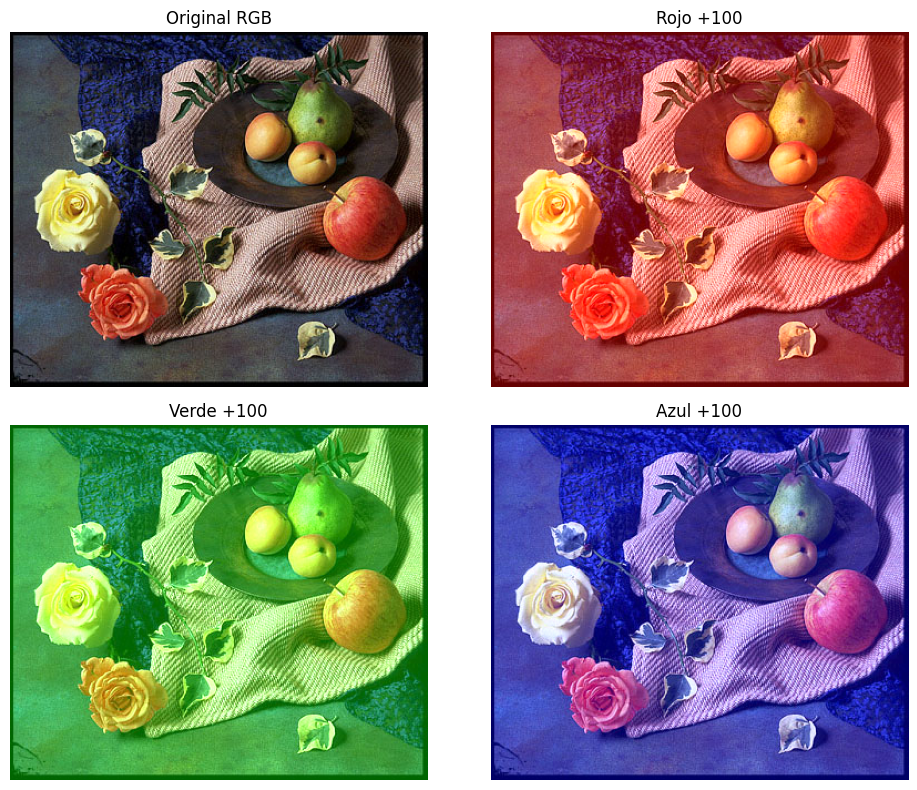

In [ ]:
#Cargamos la imágen

img1 = cv2.imread(str(path/'fruit.jpg'))

#Se define una función para modificar los canales RGB
def bgr2rgb(Rin, Gin, Bin):
    RGB = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    R, G, B = cv2.split(RGB)
    Rmod = clip(R.astype(np.int16) + Rin)
    Gmod = clip(G.astype(np.int16) + Gin)
    Bmod = clip(B.astype(np.int16) + Bin)
    RGBmod = cv2.merge([Rmod, Gmod, Bmod])
    return RGBmod

#Definición de las imagenes en RGB

rgb0 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
rgb1 = bgr2rgb(100,0,0) #Se aumenta canal R
rgb2 = bgr2rgb(0,100,0) #Se aumenta canal G
rgb3 = bgr2rgb(0,0,100) #Se aumenta canal B

# Ploteo de las imagenes con Matplotlib

fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb0);axes[0,0].set_title("Original RGB");axes[0,0].axis("off")
axes[0,1].imshow(rgb1);axes[0,1].set_title("Rojo +100");axes[0,1].axis("off")
axes[1,0].imshow(rgb2);axes[1,0].set_title("Verde +100");axes[1,0].axis("off")
axes[1,1].imshow(rgb3);axes[1,1].set_title("Azul +100");axes[1,1].axis("off")

plt.tight_layout()
plt.show()

# 2.3 HSV

HSV tiene **3 canales**, H, S y V. **H** es el HUE, y al ser este un modelo de color en coordenadas cilíndricas, el valor va en el intervalo de **[0 180]**, y dependiendo de en que franja nos encontremos existirá un color u otro. Los canales **S** y **V**, son la saturación y brillo respectivamente, toman valores de [0 255]. Cuanto **menor Saturación**, más cercano al blanco, **cuanto menor Valor**, más cercano al negro.

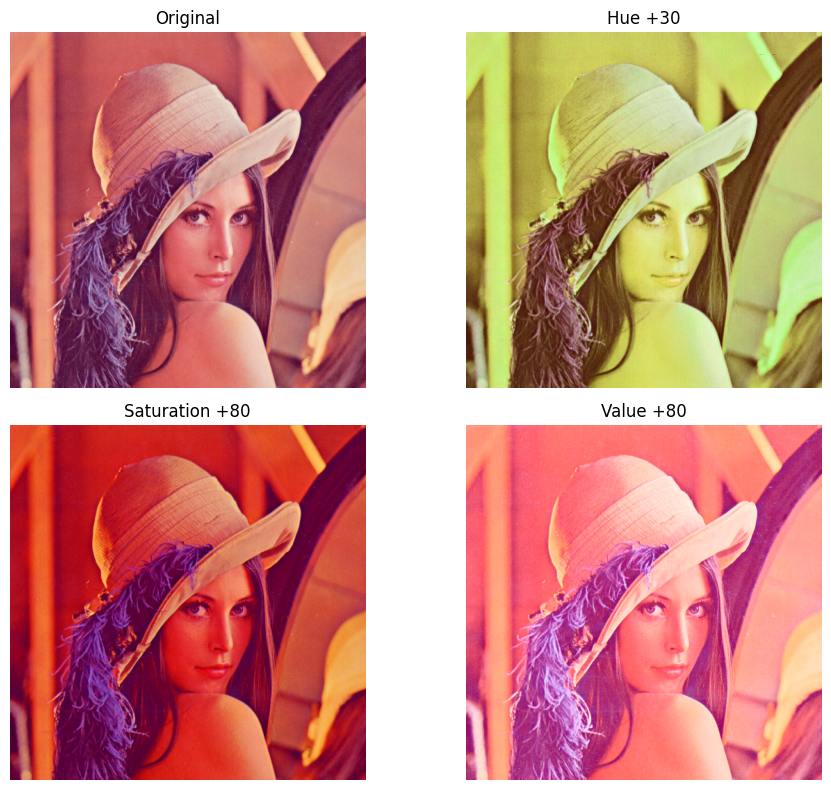

In [ ]:
img2 = cv2.imread(str(path/'lena_color.tiff'))
def bgr2hsv(Hin, Sin, Vin):
    HSV = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)
    H, S, V = cv2.split(HSV)
    Hmod = (H + Hin) % 180
    Smod = clip(S.astype(np.int16) + Sin)
    Vmod = clip(V.astype(np.int16) + Vin)
    HSVmod = cv2.merge([Hmod, Smod, Vmod])
    hsv_rgb = cv2.cvtColor(HSVmod.astype(np.uint8), cv2.COLOR_HSV2RGB)
    return hsv_rgb

#Definición de las imagenes
rgb_hsv0 = bgr2hsv(0,0,0)  # Original en RGB
rgb_hsv1 = bgr2hsv(30, 0, 0)   # Aumentamos el tono respecto del valor original, es decir, si h original es 30 tras esto sera 60
rgb_hsv2 = bgr2hsv(0, 80, 0)   # Aumenta saturación
rgb_hsv3 = bgr2hsv(0, 0, 80)   # Aumenta brillo

# Ploteo de las imagenes con Matplotlib


fig, axes = plt.subplots(2, 2, figsize=(10, 8))


axes[0,0].imshow(rgb_hsv0); axes[0,0].set_title("Original"); axes[0,0].axis("off")
axes[0,1].imshow(rgb_hsv1); axes[0,1].set_title("Hue +30"); axes[0,1].axis("off")
axes[1,0].imshow(rgb_hsv2); axes[1,0].set_title("Saturation +80"); axes[1,0].axis("off")
axes[1,1].imshow(rgb_hsv3); axes[1,1].set_title("Value +80"); axes[1,1].axis("off")

plt.tight_layout()
plt.show()

Como se puede apreciar, la imagen original tiene de por sí un HUE rojizo, es decir se encuentra en el intervalo de [170 a 180] o [0 a 10] aproximadamente. Al aumentar el HUE en 30, la imagen pasaría a verse de un color amarillo ya que se encuentra aproximadamente en el intervalo [20 35] aproximadamente. Al aumentar la saturación, mas alejado del blanco se encontrara el color, es por ello que se presencia un color más oscuro. Para el caso contrario, al aumentar el Valor, mas alejado del negro estará la imagén y es por ello que se aprecia un tono más blanco.

# 2.4 LAB

Existen tres canales **L**, luminosidad, **a** color del verde hacia el rojo, **b** color del azul hacia el verde. En teoría el canal **L** se mide en porcentaje, pero en opencv va del rango de [0 255], **a** y **b** si van de [0 255]  

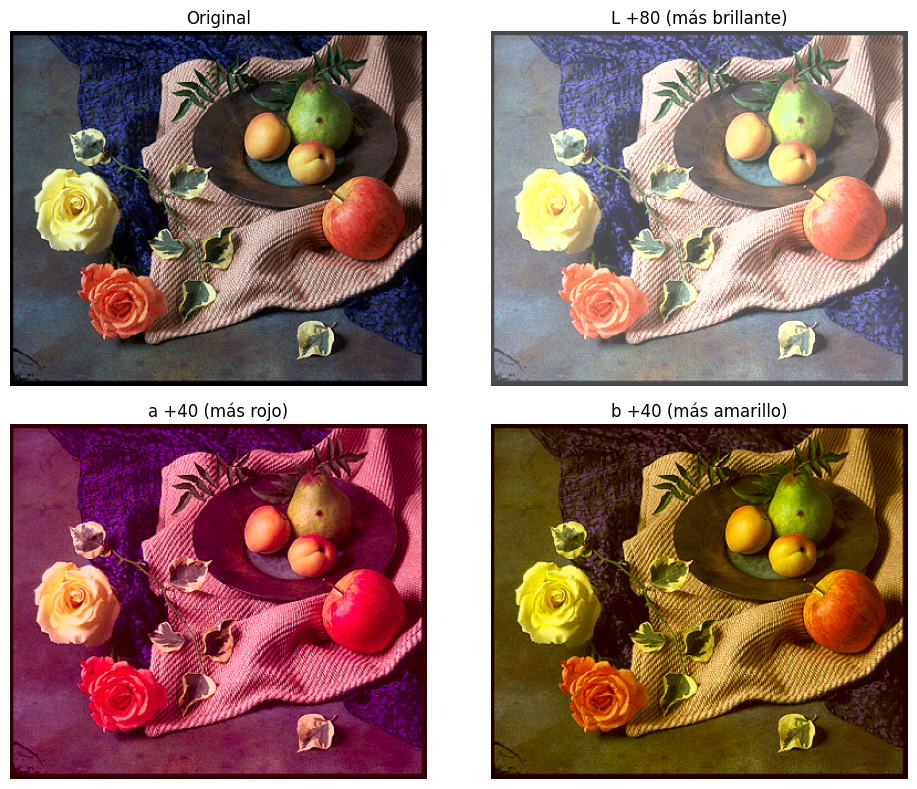

In [ ]:
img3 = cv2.imread(str(path/'fruit.jpg'))
def bgr2lab(l_in, a_in, b_in):
    LAB = cv2.cvtColor(img3, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(LAB)
    lmod = clip(l.astype(np.int16) + l_in)
    amod = clip(a.astype(np.int16) + a_in)
    bmod = clip(b.astype(np.int16) + b_in)
    labmod = cv2.merge([lmod, amod, bmod])
    lab_rgb = cv2.cvtColor(labmod.astype(np.uint8), cv2.COLOR_Lab2RGB)
    return lab_rgb

#Definición de las imagenes
rgb_lab0 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
rgb_lab1 = bgr2lab(80, 0, 0)   # Más luminosidad
rgb_lab2 = bgr2lab(0, 40, 0)   # Aumenta a, aumenta el rojo
rgb_lab3 = bgr2lab(0, 0, 40)   # aumenta b aumenta el amarillo

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb_lab0);axes[0,0].set_title("Original");axes[0,0].axis("off")
axes[0,1].imshow(rgb_lab1);axes[0,1].set_title("L +80 (más brillante)");axes[0,1].axis("off")
axes[1,0].imshow(rgb_lab2);axes[1,0].set_title("a +40 (más rojo)");axes[1,0].axis("off")
axes[1,1].imshow(rgb_lab3);axes[1,1].set_title("b +40 (más amarillo)");axes[1,1].axis("off")

plt.tight_layout()
plt.show()



En la imagen, al aumentar **L** aumenta la luminosidad de la imagen, es decir se ve más "blanca".
<div style="text-align:center"><img src="imagenes/image.png" width="35%"/></div>

Atendiendo a la imagen de arriba, de izquierda a derecha se aumenta **L**. El resultado de tener una imagen hacia el rojo cuando aumentamos **a** es porque el valor original de **b** ya es alto, y al aumentar **a** tiende al rojizo. Al aumentar **b** la imagen tiende hacia el amarillo, eso es debido a que el valor de **a** original es un valor intermedio y al aumentar **b** tiende hacia este color. Si se disminuye **a** y se incrementa **b** el color sería más verdoso

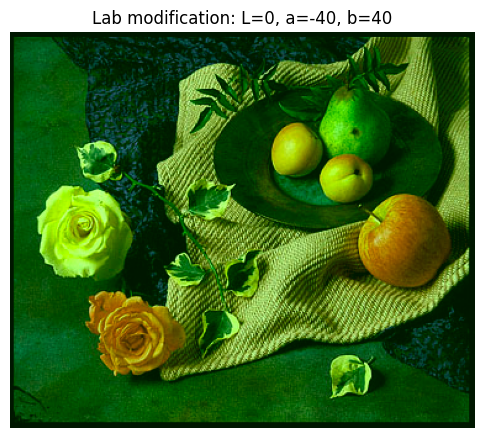

In [ ]:
rgb_lab4 = bgr2lab(0, -40, 40)
plt.figure(figsize=(6,6))
plt.imshow(rgb_lab4)
plt.title("Lab modification: L=0, a=-40, b=40")
plt.axis("off")
plt.show()

# 2.5 YCbCr


Los canales son **Y**, **Cb** y **Cr**. **Y** contiene la información de la luminancia, mientras que **Cb** y **Cr** tienen la información cromática, **Cb** para el azul y **Cr** para el rojo.

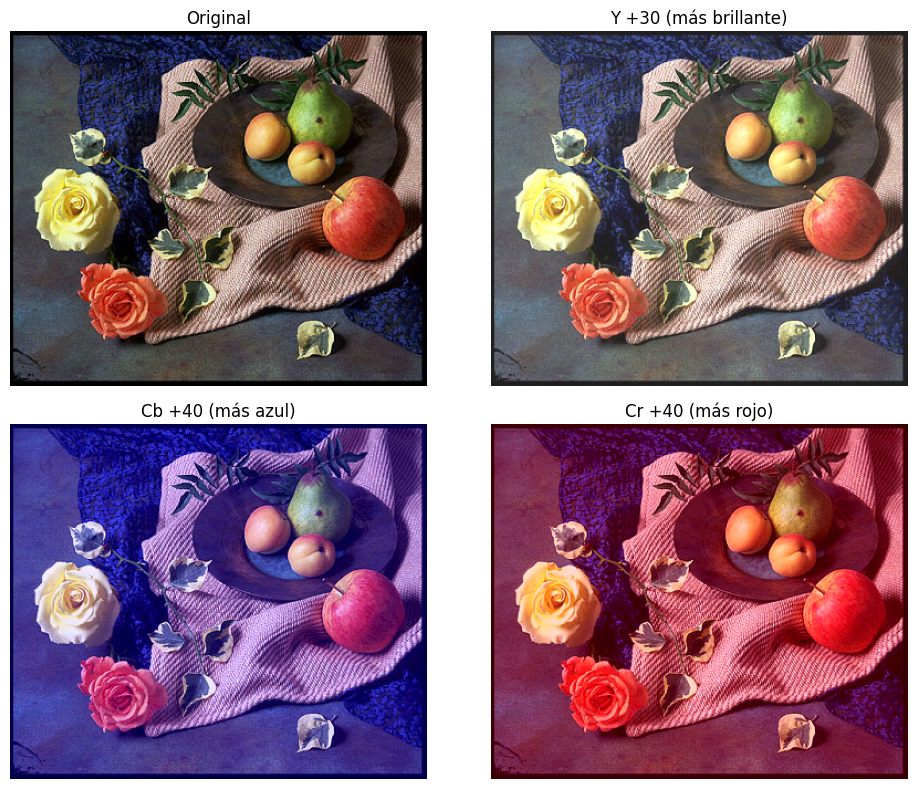

In [ ]:
img4 = cv2.imread(str(path/'fruit.jpg'))
def bgr2ycbcr(Yin, cbin, crin):
    ycbcr = cv2.cvtColor(img4, cv2.COLOR_BGR2YCR_CB)
    Y, cr, cb = cv2.split(ycbcr)
    Ymod = clip(Y.astype(np.int16) + Yin)
    cbmod = clip(cb.astype(np.int16) + cbin)
    crmod = clip(cr.astype(np.int16) + crin)
    ycbcrmod = cv2.merge([Ymod, crmod, cbmod])
    ycbcr_rgb = cv2.cvtColor(ycbcrmod.astype(np.uint8), cv2.COLOR_YCR_CB2RGB)
    return ycbcr_rgb

#Definición de las imagenes
rgb_ycbcr0 = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
rgb_ycbcr1 = bgr2ycbcr(30, 0, 0)    # Aumenta luminancia
rgb_ycbcr2 = bgr2ycbcr(0, 40, 0)    # Aumenta Cb, información para azul
rgb_ycbcr3 = bgr2ycbcr(0, 0, 40)    # Aumenta Cr, información para rojo

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb_ycbcr0);axes[0,0].set_title("Original");axes[0,0].axis("off")
axes[0,1].imshow(rgb_ycbcr1);axes[0,1].set_title("Y +30 (más brillante)");axes[0,1].axis("off")
axes[1,0].imshow(rgb_ycbcr2);axes[1,0].set_title("Cb +40 (más azul)");axes[1,0].axis("off")
axes[1,1].imshow(rgb_ycbcr3);axes[1,1].set_title("Cr +40 (más rojo)");axes[1,1].axis("off")

plt.tight_layout()
plt.show()




Como se puede observar aumentar **Y** aumenta la luminosidad, un aumento en **Cb** produce un aumento en los azules, mientras que un aumento en **Cr** intensifica el rojo. 

# 2.6 XYZ

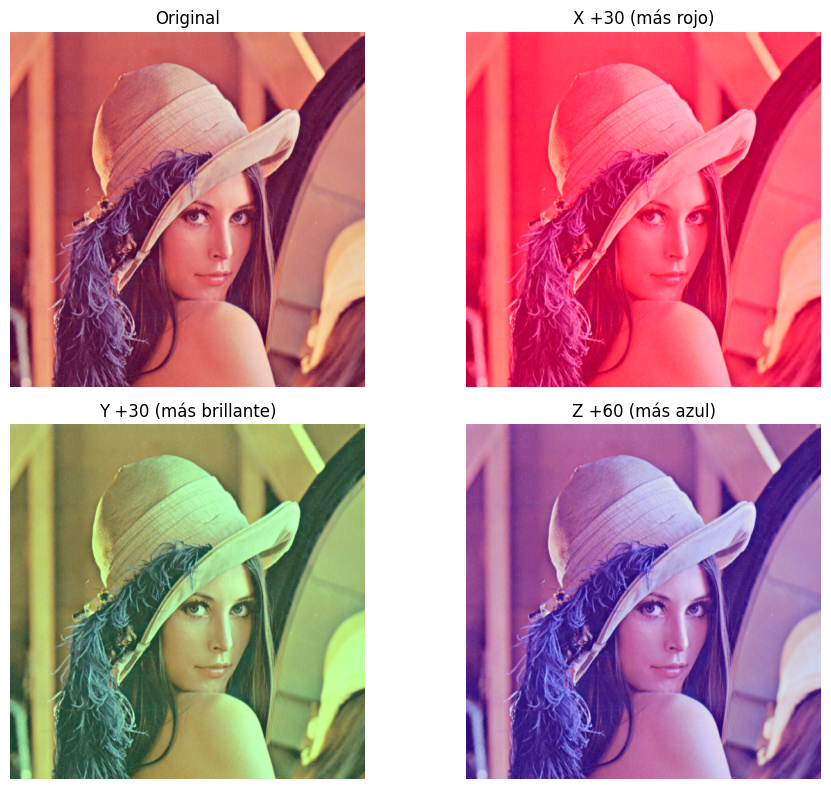

In [ ]:
img5 = cv2.imread(str(path/'lena_color.tiff'))
def bgr2xyz(xin, yin, zin):
    xyz = cv2.cvtColor(img5, cv2.COLOR_BGR2XYZ)
    x, y, z = cv2.split(xyz)
    xmod = clip(x.astype(np.int16) + xin)
    ymod = clip(y.astype(np.int16) + yin)
    zmod = clip(z.astype(np.int16) + zin)
    xyzmod = cv2.merge([xmod, ymod, zmod])
    xyz_rgb = cv2.cvtColor(xyzmod.astype(np.uint8), cv2.COLOR_XYZ2RGB)
    return xyz_rgb

#Definición de las imagenes
rgb0 = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)
rgb1 = bgr2xyz(30, 0, 0)   # Aumenta X (rojo)
rgb2 = bgr2xyz(0, 30, 0)   # Aumenta Y (verde)
rgb3 = bgr2xyz(0, 0, 60)   # Aumenta Z (azul)

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb0);axes[0,0].set_title("Original");axes[0,0].axis("off")
axes[0,1].imshow(rgb1);axes[0,1].set_title("X +30 (más rojo)");axes[0,1].axis("off")
axes[1,0].imshow(rgb2);axes[1,0].set_title("Y +30 (más brillante)");axes[1,0].axis("off")
axes[1,1].imshow(rgb3);axes[1,1].set_title("Z +60 (más azul)");axes[1,1].axis("off")

plt.tight_layout()
plt.show()

Al aumentar en **X** la imagén tiende hacia el rojo, en caso de que se disminuya, la imágen tenderá hacia el verde. Al aumentar **Z** va hacia el azul.

# 2.7 Escala de Grises


En la escala de grises tenemos solo un canal, en el que se realizará una intensifiación o reducción de la transformación del gris correspondiente a cada uno de los colores

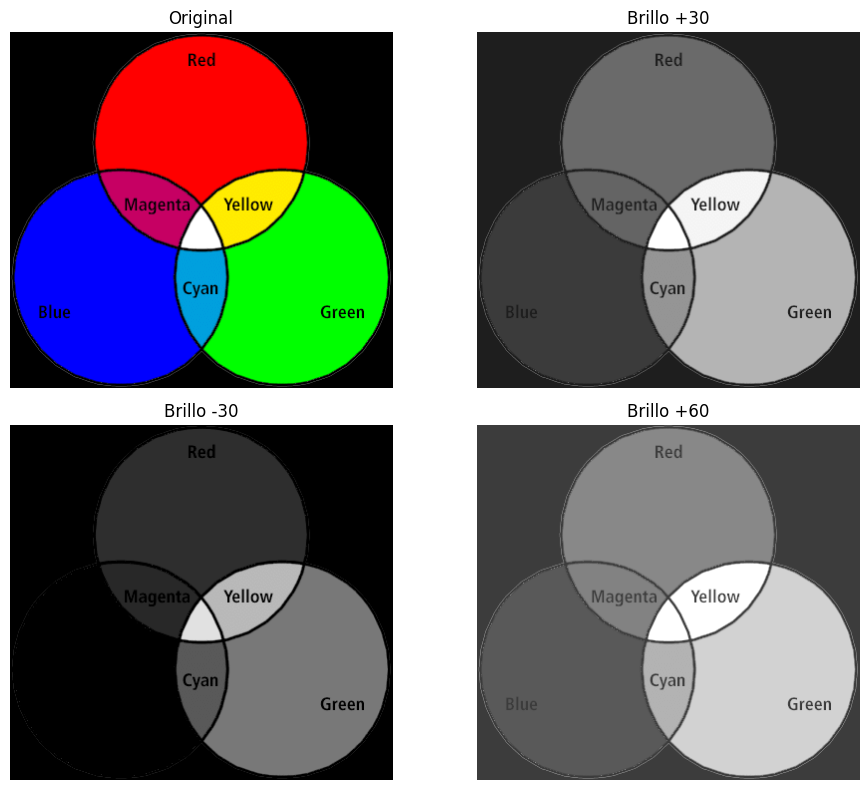

In [ ]:
img6 = cv2.imread(str(path/'rgbadd.GIF'))
def bgr2gray(ints):
    gray = cv2.cvtColor(img6, cv2.COLOR_BGR2GRAY)
    gray_mod = clip(gray.astype(np.int16) + ints)
    gray_rgb = cv2.cvtColor(gray_mod.astype(np.uint8), cv2.COLOR_GRAY2RGB)
    return gray_rgb

#Definición de las imagenes
rgb0 = cv2.cvtColor(img6, cv2.COLOR_BGR2RGB)
gray1 = bgr2gray(30)
gray2 = bgr2gray(-30)
gray3 = bgr2gray(60)

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb0);axes[0,0].set_title("Original");axes[0,0].axis("off")
axes[0,1].imshow(gray1);axes[0,1].set_title("Brillo +30");axes[0,1].axis("off")
axes[1,0].imshow(gray2);axes[1,0].set_title("Brillo -30");axes[1,0].axis("off")
axes[1,1].imshow(gray3);axes[1,1].set_title("Brillo +60");axes[1,1].axis("off")

plt.tight_layout()
plt.show()

# 2.8 YUV


En YUV existen 3 canales también, **Y**, **U** y **V**. El canal **Y** se corresponde con la luminancia, el canal **U** contiene la diferencia entre la luminancia y el azul, mientras que el canal **V** contiene la diferencia entre el canal rojo y la luminancia.

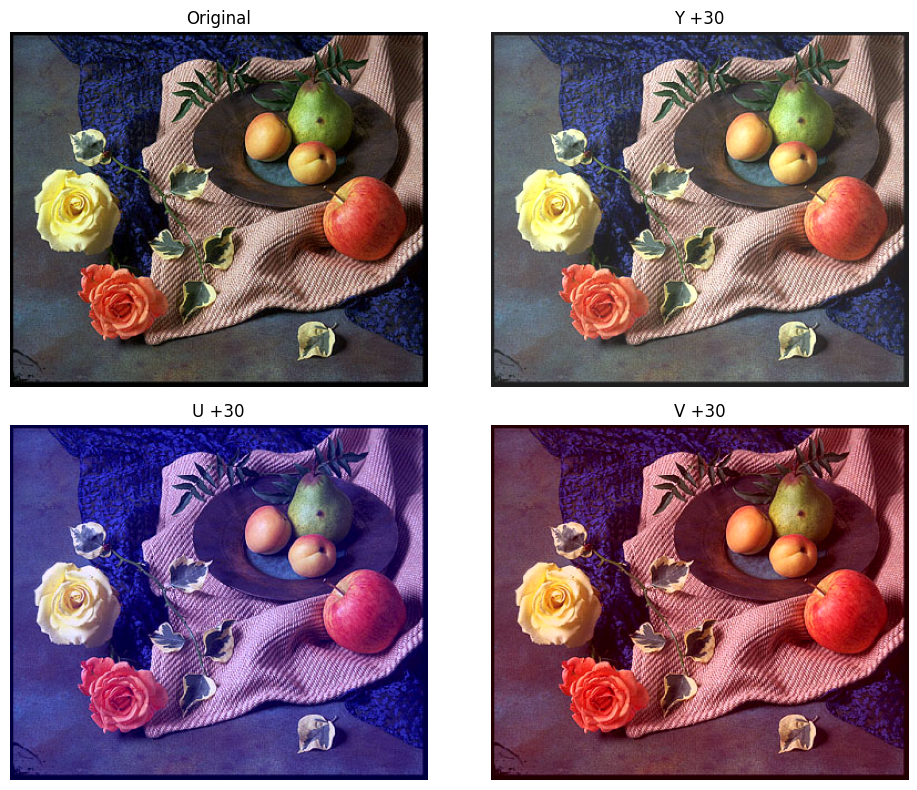

In [ ]:
img7 = cv2.imread(str(path/'fruit.jpg'))

def bgr2yuv(Y1in, Uin, Vin):
    yuv = cv2.cvtColor(img7, cv2.COLOR_BGR2YUV)  
    Y, U, V = cv2.split(yuv)
    Y1mod = clip(Y.astype(np.int16) + Y1in)
    Umod = clip(U.astype(np.int16) + Uin)
    Vmod = clip(V.astype(np.int16) + Vin)
    yuv_mod = cv2.merge([Y1mod, Umod, Vmod])
    yuv_rgb = cv2.cvtColor(yuv_mod.astype(np.uint8), cv2.COLOR_YUV2RGB)
    return yuv_rgb

#Definición de las imagenes
rgb0 = cv2.cvtColor(img7, cv2.COLOR_BGR2RGB)
rgb1 = bgr2yuv(30, 0, 0)   # Aumenta luminancia
rgb2 = bgr2yuv(0, 30, 0)   # Aumenta U
rgb3 = bgr2yuv(0, 0, 30)   #Aumenta V

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb0); axes[0,0].set_title("Original"); axes[0,0].axis("off")
axes[0,1].imshow(rgb1); axes[0,1].set_title("Y +30"); axes[0,1].axis("off")
axes[1,0].imshow(rgb2); axes[1,0].set_title("U +30"); axes[1,0].axis("off")
axes[1,1].imshow(rgb3); axes[1,1].set_title("V +30"); axes[1,1].axis("off")
plt.tight_layout(); plt.show()

Como se puede observar, al aumentar **Y** el brillo de la imagen aumenta. Al aumentar el canal **U** el color azul lo hace, y lo mismo ocurre para el rojo al aumentar el canal **V**

# 2.9 LUV

En **LUV**, exiten los canales **L**, luminancia, **U**, Cromaticidad rojo-verde, y **V** Cromaticidad amarillo-azul. Al aumentar **L** el nivel de brillo de la imágen aumentará. Al aumentar **U** el color se tornará rojizo, mientras que si se disminuye este irá hacia el verde. Por último, al aumentar **V** el color se tornará amarillo, mientras que si se disminuye este canal, el color se tornará azul.

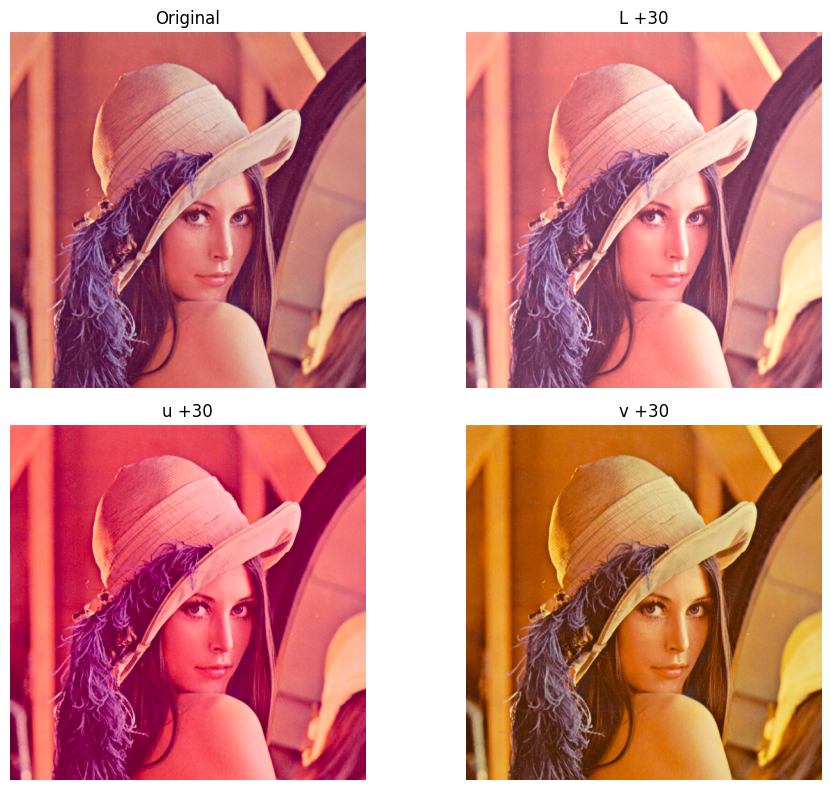

In [ ]:
img8 = cv2.imread(str(path/'lena_color.tiff'))

def bgr2luv(Lin, uin, vin):
    LUV = cv2.cvtColor(img8, cv2.COLOR_BGR2LUV)
    L, u, v = cv2.split(LUV)
    
    Lmod = np.clip(L.astype(np.int16) + Lin, 0, 255)
    umod = np.clip(u.astype(np.int16) + uin, 0, 255)
    vmod = np.clip(v.astype(np.int16) + vin, 0, 255)
    
    LUVmod = cv2.merge([Lmod, umod, vmod])
    luv_rgb = cv2.cvtColor(LUVmod.astype(np.uint8), cv2.COLOR_LUV2RGB)
    return luv_rgb

#Definición de las imagenes
rgb_luv0 = bgr2luv(0, 0, 0)      # Original
rgb_luv1 = bgr2luv(30, 0, 0)     # Más luminosidad
rgb_luv2 = bgr2luv(0, -100, 0)     # Bajamos U
rgb_luv3 = bgr2luv(0, 0, 30)     # Aumentamos V

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb_luv0); axes[0,0].set_title("Original"); axes[0,0].axis("off")
axes[0,1].imshow(rgb_luv1); axes[0,1].set_title("L +30"); axes[0,1].axis("off")
axes[1,0].imshow(rgb_luv2); axes[1,0].set_title("u -100"); axes[1,0].axis("off")
axes[1,1].imshow(rgb_luv3); axes[1,1].set_title("v +30"); axes[1,1].axis("off")

plt.tight_layout()
plt.show()

# 2.10 HSL

HSL es muy parecido a HSV, tan solo que cambia Value por Lightness **L**, y aunque puedan parecer los mismos términos, matemáticamente no lo son.

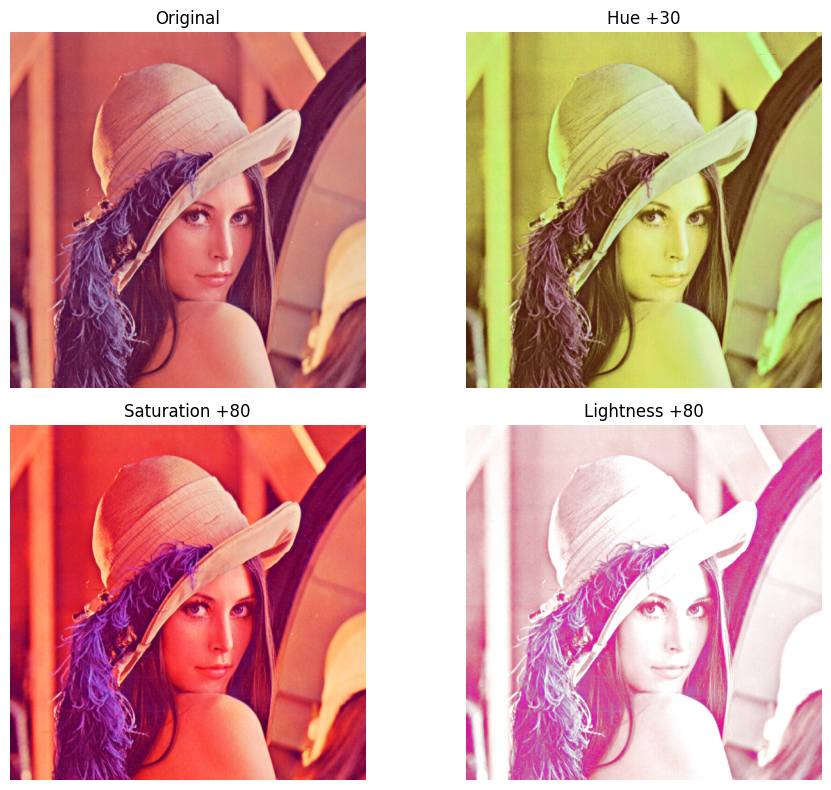

In [ ]:
img9 = cv2.imread(str(path/'lena_color.tiff'))

def bgr2hsl(H1in, S1in, L1in):
    HLS = cv2.cvtColor(img9, cv2.COLOR_BGR2HLS)
    H, L, S = cv2.split(HLS) 
    
    H1mod = (H + H1in) % 180
    S1mod = clip(S.astype(np.int16) + S1in)
    L1mod = clip(L.astype(np.int16) + L1in)
    
    HLSmod = cv2.merge([H1mod, L1mod, S1mod])
    hsl_rgb = cv2.cvtColor(HLSmod.astype(np.uint8), cv2.COLOR_HLS2RGB)
    return hsl_rgb

#Definición de las imagenes
rgb_hsl0 = bgr2hsl(0, 0, 0)      # Original
rgb_hsl1 = bgr2hsl(30, 0, 0)     # Aumentamos H como en HSV
rgb_hsl2 = bgr2hsl(0, 80, 0)     # Aumenta saturación
rgb_hsl3 = bgr2hsl(0, 0, 80)     # Aumenta luminosidad

# Ploteo de las imagenes con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0,0].imshow(rgb_hsl0); axes[0,0].set_title("Original"); axes[0,0].axis("off")
axes[0,1].imshow(rgb_hsl1); axes[0,1].set_title("Hue +30"); axes[0,1].axis("off")
axes[1,0].imshow(rgb_hsl2); axes[1,0].set_title("Saturation +80"); axes[1,0].axis("off")
axes[1,1].imshow(rgb_hsl3); axes[1,1].set_title("Lightness +80"); axes[1,1].axis("off")

plt.tight_layout()
plt.show()